# NeurIPS data analysis - GEX of CITE-seq data sets

In [2]:
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp

import os

In [3]:
sc.set_figure_params(scanpy=True, dpi=60, dpi_save=250,
                     frameon=False,
                     color_map="YlGnBu", format='pdf', transparent=False,
                     ipython_format='png2x', figsize=(7,7))

In [4]:
sc.logging.print_header()

scanpy==1.7.2 anndata==0.7.6 umap==0.5.1 numpy==1.20.3 scipy==1.7.1 pandas==1.2.5 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.9.6 louvain==0.7.0


# Load raw data

In [5]:
os.getcwd()

'/home/jovyan/project/neurips2021-notebooks/notebooks/templates'

In [6]:
os.chdir('/home/jovyan/project/neurips2021-notebooks/')

In [7]:
adata = sc.read_10x_h5('data/cite/raw_data/s1d1/filtered_feature_bc_matrix.h5', gex_only=False)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
adata.var['feature_types'].value_counts()

Gene Expression     36601
Antibody Capture      140
Name: feature_types, dtype: int64

In [9]:
adata_adt = adata[:,adata.var['feature_types'].isin(['Antibody Capture'])].copy()
adata_gex = adata[:,adata.var['feature_types'].isin(['Gene Expression'])].copy()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [10]:
adata_adt

AnnData object with n_obs × n_vars = 8785 × 140
    var: 'gene_ids', 'feature_types', 'genome'

In [11]:
adata_gex

AnnData object with n_obs × n_vars = 8785 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [12]:
adata_gex.var_names_make_unique()

# Test R methods

Note: you might have to set your `.libPaths()` variable to only track the libraries from your conda environment. This can be done by writing something like the following into a jupyter cell:

```
%R .libPaths(.libPaths()c[3,2])
```

The `c[3,2]` should be altered here to give priority to the relevant libraries. Note that the first library is given priority (in this example, the library originally in 3rd position in the `.libPaths()` output.

In [13]:
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [14]:
%R library(scran)

'scran','scuttle','SingleCe...,...,'datasets','methods','base'


# QC

QC is done mainly by filtering jointly on the number of counts, the number of genes, and considering the fraction of mitochondrial reads

In [15]:
# Compute QC metrics
adata_gex.var["mt"] = adata_gex.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata_gex, qc_vars=["mt"], inplace=True)

... storing 'feature_types' as categorical
... storing 'genome' as categorical


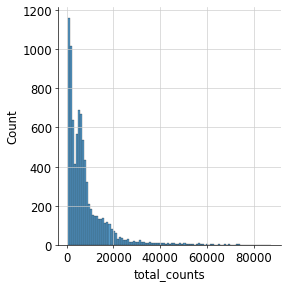

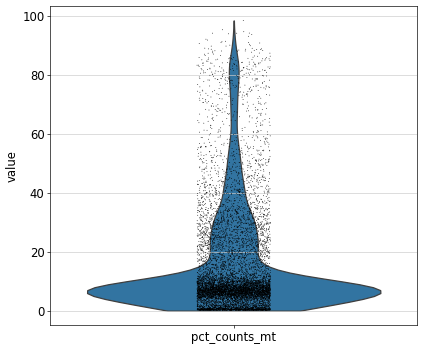

In [16]:
t1 = sns.displot(adata_gex.obs['total_counts'], bins=100, kde=False)
t2 = sc.pl.violin(adata_gex, 'pct_counts_mt')
t3 = sns.displot(adata_gex.obs['pct_counts_mt'], bins=100, kde=False)

There is a considerable fraction of cells with 20% and mroe MT-read fraction. Permissive filtering around 38 %, more strict filtering around 20%

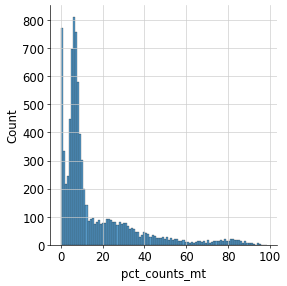

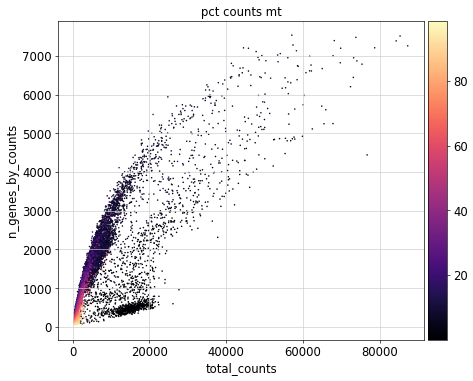

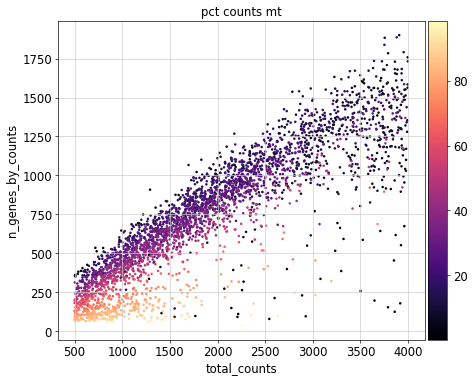

In [17]:
#Data quality summary plots
p1 = sc.pl.scatter(adata_gex, 'total_counts', 'n_genes_by_counts',
                   color='pct_counts_mt',color_map='magma')
p2 = sc.pl.scatter(adata_gex[adata_gex.obs['total_counts']<4000], 'total_counts', 'n_genes_by_counts',
                   color='pct_counts_mt', color_map='magma')

Bad quality cells show very high mito fraction.

Tried out permissive mt threshold of 38% first, but that resulted in low quality clusters, so threshold of 20% should be chosen in this case.

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


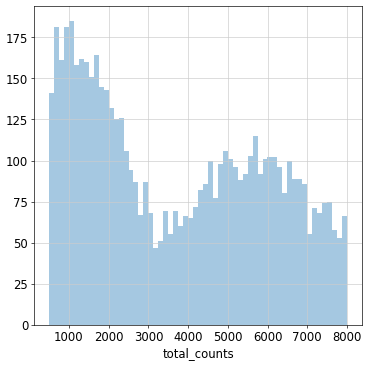

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


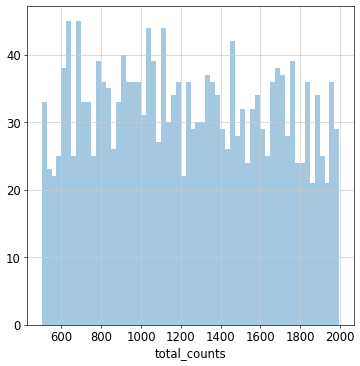

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


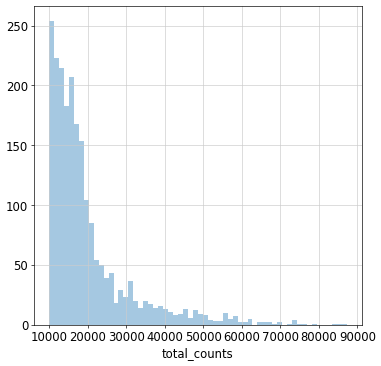

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


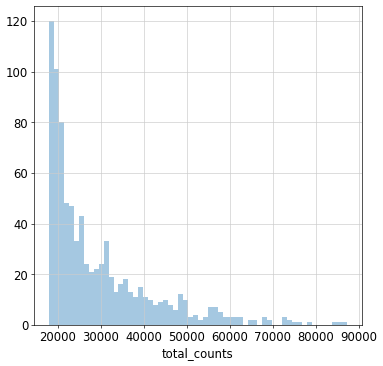

In [18]:
#Thresholding decision: counts
# Here we check the univariate distributions for low-quality outlier peaks. We especially zoom in on lower values
p3 = sns.distplot(adata_gex.obs['total_counts'][adata_gex.obs['total_counts']<8000], kde=False, bins=60)
plt.show()

p4 = sns.distplot(adata_gex.obs['total_counts'][adata_gex.obs['total_counts']<2000], kde=False, bins=60)
plt.show()

p5 = sns.distplot(adata_gex.obs['total_counts'][adata_gex.obs['total_counts']>10000], kde=False, bins=60)
plt.show()

p6 = sns.distplot(adata_gex.obs['total_counts'][adata_gex.obs['total_counts']>18000], kde=False, bins=60)
plt.show()

Thresholding options:

Lower bound:
- 750 -> use this
- 850
- 1200

Upper bound:
- 27000 
- 33000 -> go for this
- 37500 
- 47000

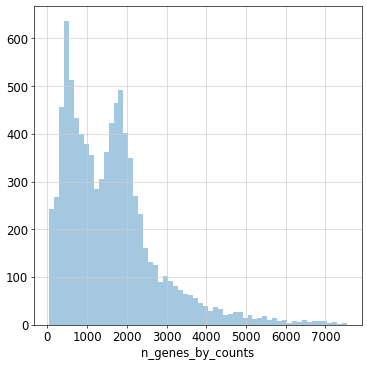

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


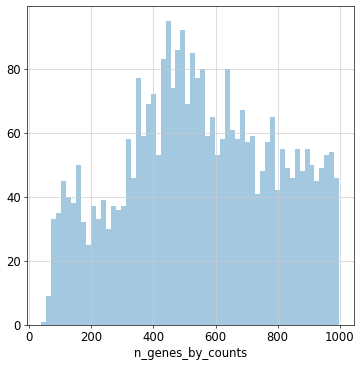

In [19]:
#Thresholding decision: genes
p7 = sns.distplot(adata_gex.obs['n_genes_by_counts'], kde=False, bins=60)
plt.show()

p8 = sns.distplot(adata_gex.obs['n_genes_by_counts'][adata_gex.obs['n_genes_by_counts']<1000], kde=False, bins=60)
plt.show()


Gene thresholding options:
- 200 -> try this first
- 270

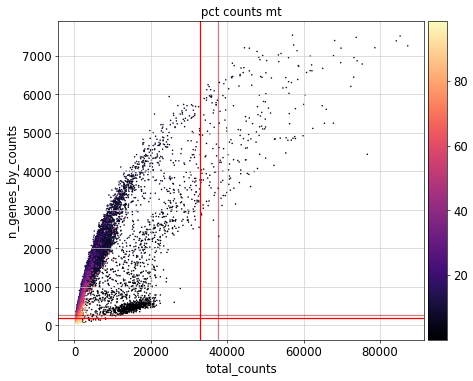

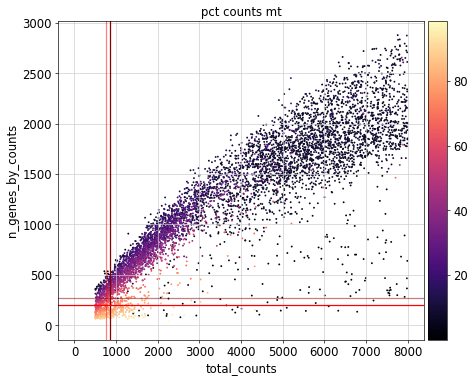

In [20]:
# Visualize the chosen thresholds jointly, before filtering out cells
counts_upper = 33000
counts_upper_alt = 37500
counts_lower = 750
counts_lower_alt = 850
genes_lower = 200
genes_lower_alt = 270

# Upper count thresholds
p9 = sc.pl.scatter(adata_gex, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt',
                   show=False, color_map='magma')
p9.axline((counts_upper,0),(counts_upper,1), color='red')
p9.axline((counts_upper_alt,0),(counts_upper_alt,1), color='darkred', alpha=0.5)
p9.axline((0,genes_lower),(1,genes_lower), color='red')
p9.axline((0,genes_lower_alt),(1,genes_lower_alt), color='darkred', alpha=0.5)
plt.show()

# lower count thresholds
count_lim = 8000
p10 = sc.pl.scatter(adata_gex[adata_gex.obs['total_counts']<count_lim], 'total_counts', 'n_genes_by_counts',
                    color='pct_counts_mt', show=False, color_map='magma')
p10.axline((counts_lower,0),(counts_lower,1), color='red', alpha=0.5)
p10.axline((counts_lower_alt,0),(counts_lower_alt,1), color='darkred')
p10.axline((0,genes_lower),(1,genes_lower), color='red')
p10.axline((0,genes_lower_alt),(1,genes_lower_alt), color='darkred', alpha=0.5)
plt.show()

Final thresholding decisions:
- Counts lower: 750 (850 might be better, check low count clusters)
- Counts upper: 33000 (27000 might be better to reduce cells that potentially hard to annotate)
- Genes: 270 (removes high mt frac cells, but keeps cell cluster with low mt frac)
- MT threshold: 20% (permissive threshold of 38% resulted in several low quality cell clusters)

These thresholds were chosen to remove most higher MT fraction cells with low count and number of genes. Using a less permissive upper count threshold is fine, as these cells are often challenging to annotate and might be doublets. 

In [21]:
# Filter cells according to identified QC thresholds:
print('Total number of cells: {:d}'.format(adata_gex.n_obs))

sc.pp.filter_cells(adata_gex, min_counts = 750)
print('Number of cells after min count filter: {:d}'.format(adata_gex.n_obs))

sc.pp.filter_cells(adata_gex, max_counts = 33000)
print('Number of cells after max count filter: {:d}'.format(adata_gex.n_obs))

sc.pp.filter_cells(adata_gex, min_genes = 270)
print('Number of cells after gene filter: {:d}'.format(adata_gex.n_obs))

adata_gex = adata_gex[adata_gex.obs.pct_counts_mt < 20,:]
print('Number of cells after MT frac filter: {:d}'.format(adata_gex.n_obs))

Total number of cells: 8785
Number of cells after min count filter: 8463
Number of cells after max count filter: 8230
Number of cells after gene filter: 7977
Number of cells after MT frac filter: 6206


In [22]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata_gex.n_vars))

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata_gex, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata_gex.n_vars))

Trying to set attribute `.var` of view, copying.


Total number of genes: 36601
Number of genes after cell filter: 15422


# Normalization

In [23]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata_gex.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added='groups', resolution=0.5)

In [24]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata_gex.X.T.A

In [25]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = sizeFactors(computeSumFactors(SingleCellExperiment(list(counts=data_mat)), clusters=input_groups, min.mean=0.1))

In [26]:
#Delete adata_pp
del adata_pp

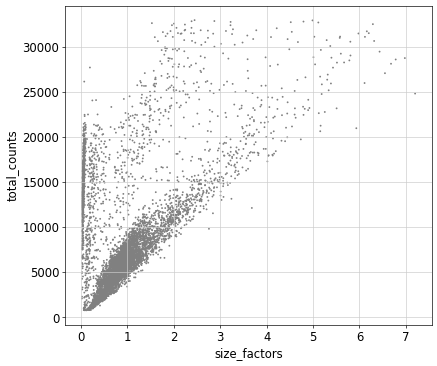

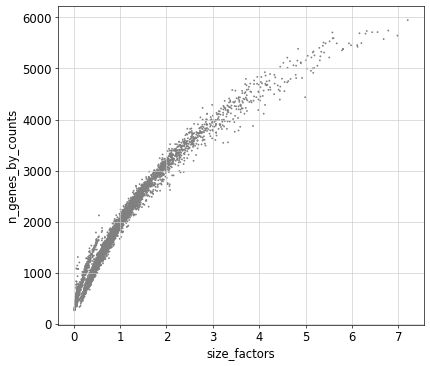

/srv/conda/envs/saturn/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


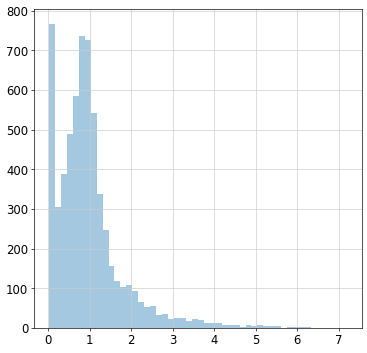

In [27]:
# Visualize the estimated size factors
adata_gex.obs['size_factors'] = size_factors

sc.pl.scatter(adata_gex, 'size_factors', 'total_counts')
sc.pl.scatter(adata_gex, 'size_factors', 'n_genes_by_counts')

sns.distplot(size_factors, bins=50, kde=False)
plt.show()

No size factors are below 0, and the range of size factors is manageable (not >10, and mostly <4)

In [28]:
#Keep the count data in a counts layer
adata_gex.layers["counts"] = adata_gex.X.copy()

#Normalize adata 
adata_gex.X /= adata_gex.obs['size_factors'].values[:,None]
sc.pp.log1p(adata_gex)

#Transform back into a sparse matrix
adata_gex.X = sp.sparse.csr_matrix(adata_gex.X)

#Store the full data set in 'raw' as log-normalised data for statistical testing
adata_gex.raw = adata_gex

# HVGs

In [29]:
sc.pp.highly_variable_genes(adata_gex, flavor='cell_ranger', n_top_genes=4000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata_gex.var['highly_variable'])))


 Number of highly variable genes: 4000


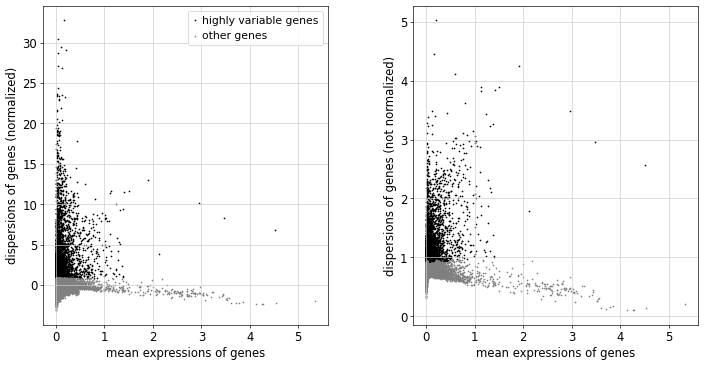

In [30]:
sc.pl.highly_variable_genes(adata_gex)

# Visualization

In [31]:
# Calculate the visualizations
sc.pp.pca(adata_gex, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_gex)
sc.tl.umap(adata_gex)

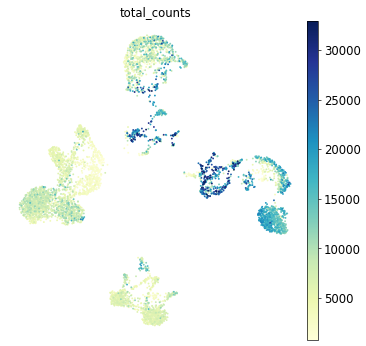

In [32]:
sc.pl.umap(adata_gex, color='total_counts')

We see a high count area aggregated in the middle and a low count cluster on the left of the UMAP... this can be problematic (doublets or low quality cells), that we will consider during the cluster annotation.

# CC scoring

In [33]:
# get file here: https://raw.githubusercontent.com/theislab/single-cell-tutorial/master/Macosko_cell_cycle_genes.txt
cc_genes_file = 'data/Macosko_cell_cycle_genes.txt'


In [34]:
#Score cell cycle and visualize the effect:
cc_genes = pd.read_table(cc_genes_file, delimiter='\t')
s_genes = cc_genes['S'].dropna()
g2m_genes = cc_genes['G2.M'].dropna()

s_genes_ens = adata_gex.var_names[np.in1d(adata_gex.var_names, s_genes)]
g2m_genes_ens = adata_gex.var_names[np.in1d(adata_gex.var_names, g2m_genes)]

sc.tl.score_genes_cell_cycle(adata_gex, s_genes=s_genes_ens, g2m_genes=g2m_genes_ens)

... storing 'phase' as categorical


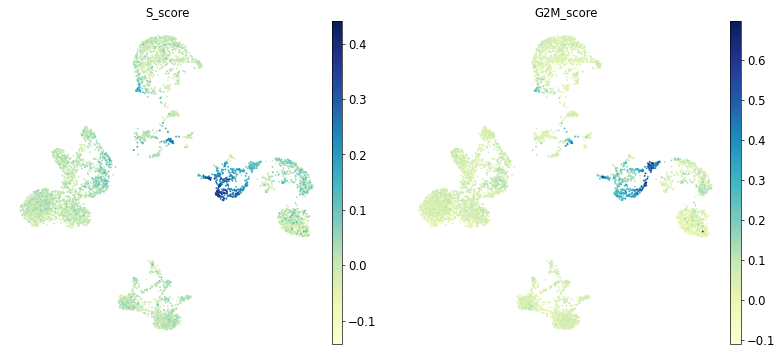

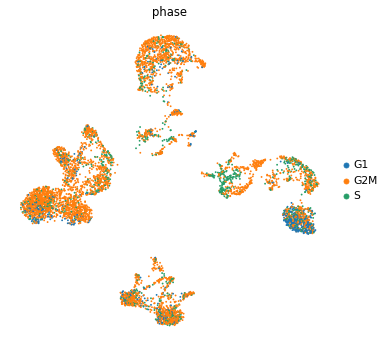

In [35]:
sc.pl.umap(adata_gex, color=['S_score', 'G2M_score'], use_raw=False)
sc.pl.umap(adata_gex, color='phase', use_raw=False)

There is 1 cluster with a clear cell cycle separation, this is likely cycling erythroblasts. This gives the first hint at where the erythrocyte differentiation trajectory is. Also interesting: Cycling cells have high counts (-> choosing hight max count threshold)

# Clustering

Let the fun begin! First step, cluster at several resolutions and select the resolution that broadly captures the structure you see in the UMAP. Try to avoid getting into detailed substructure already at this early stage.

In [36]:
sc.tl.leiden(adata_gex, resolution=0.3, key_added='leiden_res0.3')
sc.tl.leiden(adata_gex, resolution=0.5, key_added='leiden_res0.5')
sc.tl.leiden(adata_gex, resolution=0.8, key_added='leiden_res0.8')
sc.tl.leiden(adata_gex, resolution=1, key_added='leiden_res1')

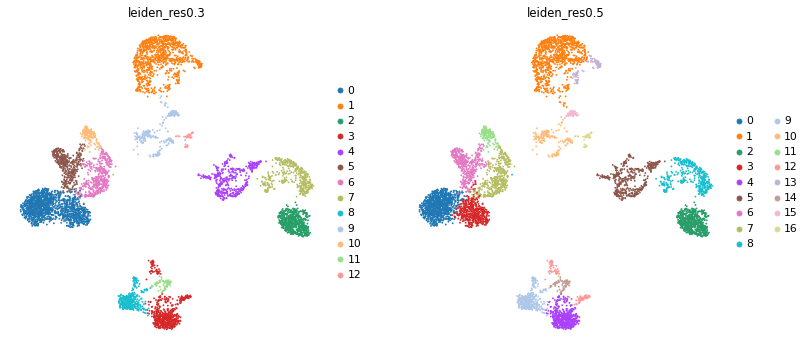

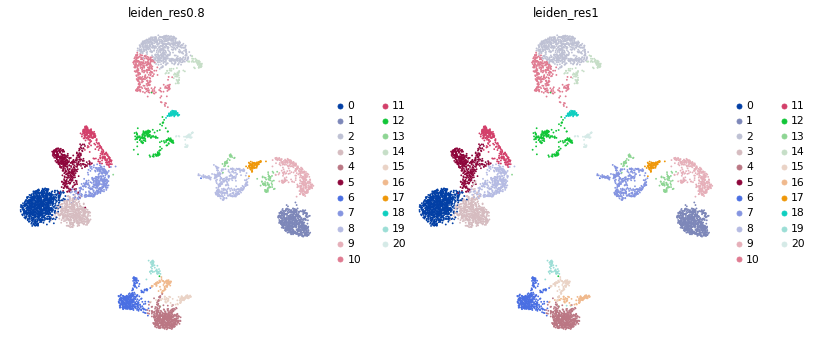

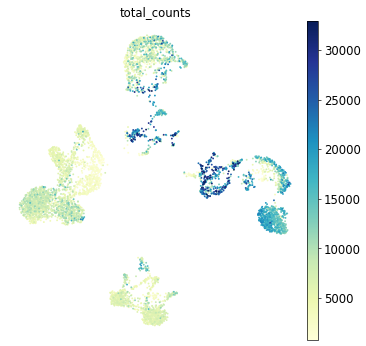

In [37]:
sc.pl.umap(adata_gex, color=['leiden_res0.3', 'leiden_res0.5'])
sc.pl.umap(adata_gex, color=['leiden_res0.8', 'leiden_res1'])
sc.pl.umap(adata_gex, color='total_counts')

Check which clusters have the problematic aggregation of high/low-count cells... these might be difficult to annotate and could be doublets low count cells.

# Doublet detection

Doublet detection to gain extra evidence for which cells are actually two separate cells that happen to be assigned to the same barcode (doublets).

In [38]:
test_dat = adata_gex.copy()
test_dat.X = adata_gex.raw.X

In [39]:
sc.external.pp.scrublet(test_dat)

/srv/conda/envs/saturn/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 3.0%
Estimated detectable doublet fraction = 64.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.6%


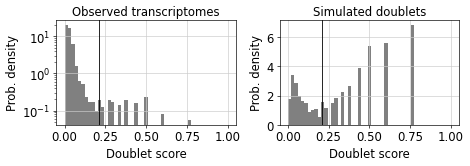

In [40]:
sc.external.pl.scrublet_score_distribution(test_dat)
plt.show()

The distribution of simulated doublets show that potentially a score over 0.23 is already indicative of a doublet. Note that not all doublets will be detectable in this way and it will be more valuable to remove entire clusters based on these scores.

In [41]:
adata_gex.obs['doublet_score'] = test_dat.obs['doublet_score']
adata_gex.obs['predicted_doublet'] = test_dat.obs['predicted_doublet'].astype(str)

In [42]:
del test_dat

... storing 'predicted_doublet' as categorical


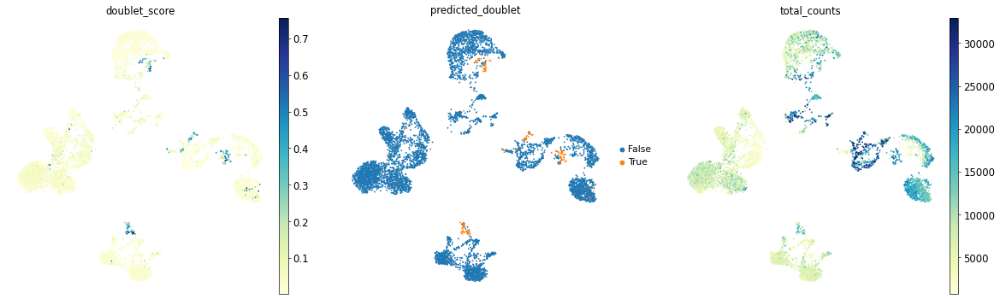

In [43]:
sc.pl.umap(adata_gex, color=['doublet_score', 'predicted_doublet', 'total_counts'])

# Marker genes

In [187]:
marker_genes = {
    'CD14+ Mono': ['FCN1', 'CD14'],
    'CD16+ Mono': ['TCF7L2', 'FCGR3A', 'LYN'],
    'ID2-hi myeloid prog': ['CD14', 'ID2', 'VCAN', 'S100A9', 'CLEC12A', 'KLF4', 'PLAUR'],
    'cDC1': ['CLEC9A', 'CADM1'],
    'cDC2': ['CLEC10A', 'FCER1A', 'CST3', 'COTL1', 'LYZ', 'DMXL2'], # Note: DMXL2 should be negative
    'Reticulocyte': ['SLC4A1', 'SLC25A37', 'HBB', 'HBA2', 'HBA1', 'TFRC'], # TFRC negative
    'Normoblast': ['SLC4A1', 'SLC25A37', 'HBB', 'HBA2', 'HBA1', 'TFRC'],  # TFRC positive
    'Erythroblast': ['MKI67', 'HBA1', 'HBB'],
    'Proerythroblast': ['CDK6', 'SYNGR1', 'HBM', 'GYPA'], # Note HBM and GYPA are negative markers   # CRACD as well, but not present in data
    'NK': ['GNLY', 'NKG7', 'CD247', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A'], # GRIK4 as well, but not present in data
    'ILC': ['ID2', 'PLCG2', 'GNLY', 'SYNE1'],
    'Lymph prog': ['IGLL1', 'VPREB1', 'MME', 'EBF1', 'SSBP2', 'BACH2', 'CD79B', 'IGHM', 'PAX5', 'PRKCE', 'DNTT'],  # new: STMN1
    'naive CD20+ B - IGKC+':['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM', 'IGKC'],
    'naive CD20+ B - IGKC-':['MS4A1', 'IL4R', 'IGHD', 'FCRL1', 'IGHM', 'IGKC'], # IGKC negative
    'B1 B - IGKC+':['MS4A1', 'SSPN', 'ITGB1','IGKC', 'EPHA4', 'COL4A4', 'PRDM1', 'ZNF215', 'IRF4', 'CD38', 'XBP1', 'PAX5', 'BCL11A', 'BLK', 'IGHD', 'IGHM'],# Note IGHD and IGHM are negative markers
    'B1 B - IGKC-':['MS4A1', 'SSPN', 'ITGB1', 'EPHA4', 'COL4A4', 'PRDM1', 'ZNF215', 'IRF4', 'CD38', 'XBP1', 'PAX5', 'BCL11A', 'BLK', 'IGHD', 'IGHM', 'IGKC'],# Note IGKC, IGHD and IGHM are negative markers
    'transitional B': ['MME', 'CD38', 'CD24', 'ACSM3', 'MSI2'],
    'Plasma cells': ['MZB1', 'HSP90B1', 'FNDC3B', 'PRDM1', 'IGKC', 'JCHAIN'],
    'Plasmablast': ['XBP1', 'PRDM1', 'PAX5'],  # Note PAX5 is a negative marker   # RF4 as well, but not present in data
    'CD4+ T activated': ['CD4', 'IL7R', 'TRBC2', 'ITGB1'],
    'CD4+ T naive': ['CD4', 'IL7R', 'TRBC2', 'CCR7'],
    'CD8+ T': ['CD8A', 'CD8B', 'GZMB', 'GZMA', 'CCL5', 'GZMK', 'GZMH', 'GZMA'],
    'T activation': ['CD69', 'CD38'], # CD69 much better marker!
    'T naive': ['LEF1', 'CCR7', 'TCF7'],
    'pDCs': ['GZMB', 'IL3RA', 'COBLL1', 'TCF4'],
    'G/M prog': ['MPO', 'BCL2', 'KCNQ5', 'CSF3R', 'PRTN3'], 
    'HSC': ['NRIP1', 'MECOM', 'PROM1', 'CD34', 'NKAIN2'], 
    'MK/E prog': ['ZNF385D', 'ITGA2B', 'PLCB1'], # 'RYR3' as well,  but not present in data
    'HSPC STMN1+':['STMN1', 'HMGB1'] # newly characterized
}


In [155]:
sc.tl.rank_genes_groups(adata_gex, groupby='leiden_res0.5', key_added='rank_genes_res0.5')

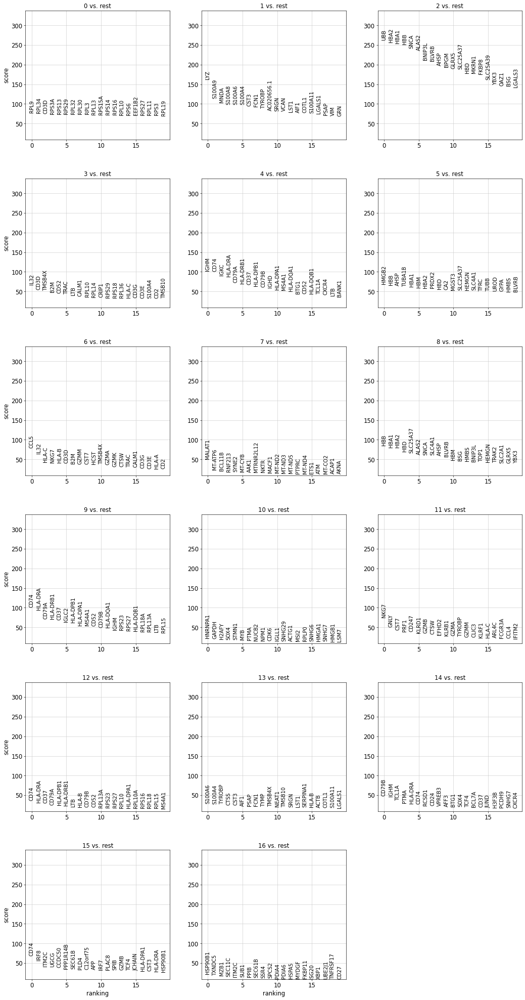

In [156]:
sc.pl.rank_genes_groups(adata_gex, key='rank_genes_res0.5', ncols=3, fontsize=12)

## Literature markers

In [157]:
from matplotlib import colors

#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,3))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

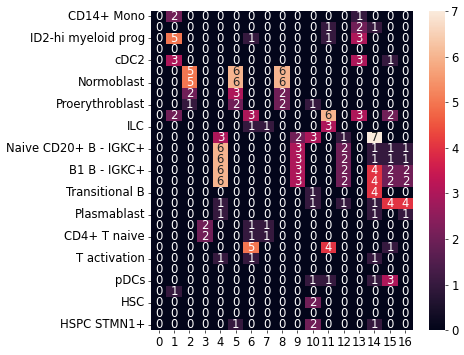

In [158]:
sns.heatmap(sc.tl.marker_gene_overlap(adata_gex, reference_markers=marker_genes, key='rank_genes_res0.5'), annot=True)
plt.show()

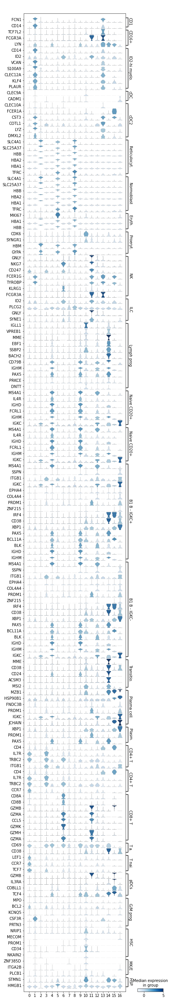

In [159]:
# Look at the marker genes in a concise manner
filt_marker_genes = dict()
for key,val in marker_genes.items():
    filt_vals = [i for i in val if i in adata_gex.var_names]
    filt_marker_genes[key] = filt_vals

adata_plot = adata_gex.copy()
sc.pp.scale(adata_plot, max_value=5)
    
sc.pl.stacked_violin(adata_plot, var_names = filt_marker_genes, groupby='leiden_res0.5', use_raw=False, swap_axes=True)

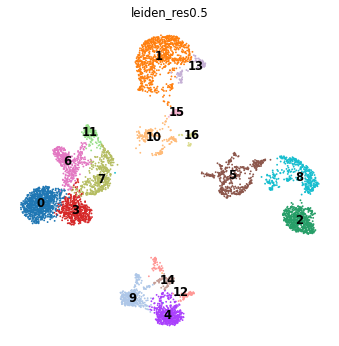

In [50]:
sc.pl.umap(adata_gex, color='leiden_res0.5', legend_loc = 'on data')

In [51]:
# Look at marker expression (commented out to decrease notebook size (Expression also plotted during clustering)
# Note that some markers are meant to be negative! (DMXL2, HBM, GYPA, IGHD, IGHM for some cell types)
#for i in marker_genes.keys():
#    print(f'Cluster: {i}')
#    genes_to_plot = [i for i in marker_genes[i] if i in adata_gex.var_names]
#    sc.pl.umap(adata_gex, color=genes_to_plot, ncols=3, use_raw=False, cmap=mymap)

In [52]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

Marker genes suggest:
- 0: CD4+ T naive
- 1: CD14+ Monocytes and cDC2 substructure!
- 2: Reticulocyte
- 3: CD4+ T activated
- 4: Naive CD20+ B #  compare to cluster 9, substructure!
- 5: Proerythroblast, cycling Erythroblast and Erythroblast and doublets substructure
- 6: CD8+ T
- 7: Doublet/lowQ? and ILCs?
- 8: Normoblast ? (not all Erythroblast markers)
- 9: Naive CD20+ B #  compare to cluster 4, substructure!
- 10: Prog cells, substructure incl HSC, cDC1, Lymph prog, G/M prog, MK/E prog
- 11: NK
- 12: B1 B and doublet?
- 13: CD16+ Mono and doublet
- 14: Transitional B
- 15: pDCs
- 16: Plasma cells

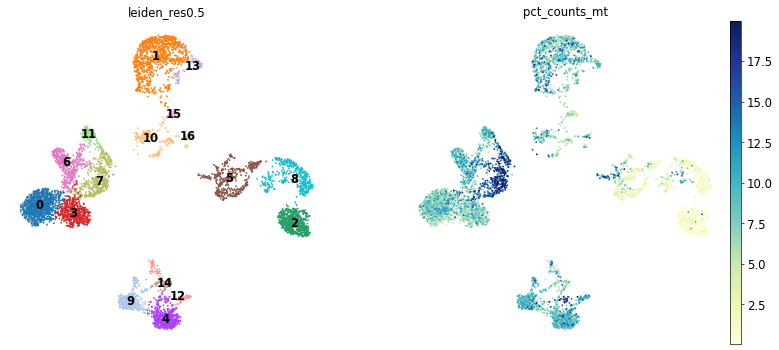

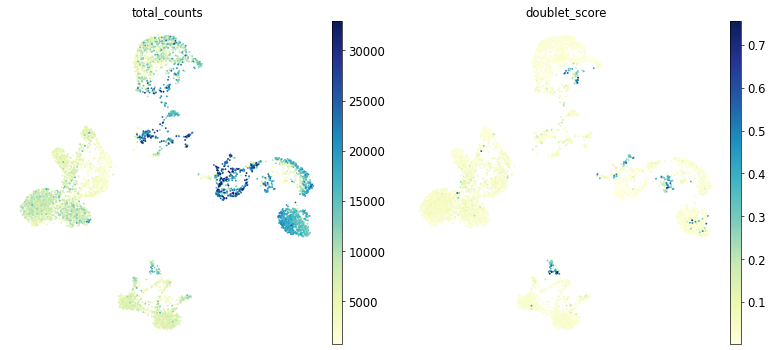

In [53]:
# Check some technical markers to assess potential doublet or low quality clusters
sc.pl.umap(adata_gex, color=['leiden_res0.5', 'pct_counts_mt'], legend_loc = 'on data')
sc.pl.umap(adata_gex, color=['total_counts', 'doublet_score'])

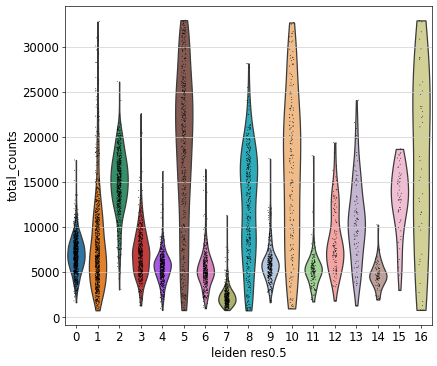

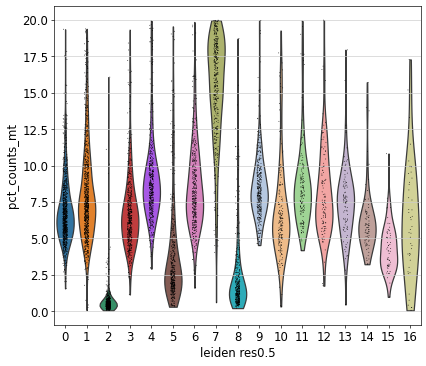

In [54]:
sc.pl.violin(adata_gex, keys='total_counts', groupby='leiden_res0.5')
sc.pl.violin(adata_gex, keys='pct_counts_mt', groupby='leiden_res0.5')

**LowQ and doublets**
- Part of cluster 7, 4, 8, 5: lowQ cells
- Part of 12, 13, 5, 8: Douplets

**Marker genes suggest**
- 0: CD4+ T naive
- 1: CD14+ Monocytes and cDC2 substructure!
- 2: Reticulocyte
- 3: CD4+ T activated
- 4: Naive CD20+ B #  compare to cluster 9, substructure!
- 5: Proerythroblast, cycling Erythroblast and Erythroblast and doublets substructure
- 6: CD8+ T
- 7: Doublet/lowQ? and ILCs?
- 8: Normoblast ? (not all Erythroblast markers)
- 9: Naive CD20+ B #  compare to cluster 4, substructure!
- 10: Prog cells, substructure incl HSC, cDC1, Lymph prog, G/M prog, MK/E prog
- 11: NK
- 12: B1 B and doublet?
- 13: CD16+ Mono and doublet
- 14: Transitional B
- 15: pDCs
- 16: Plasma cells

# Subclustering

Note that you will likely need to adapt the `resolution` parameter to optimally represent the substructure you see in the data.

## T and NK cells

### Cluster 0

In [55]:
orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '0'

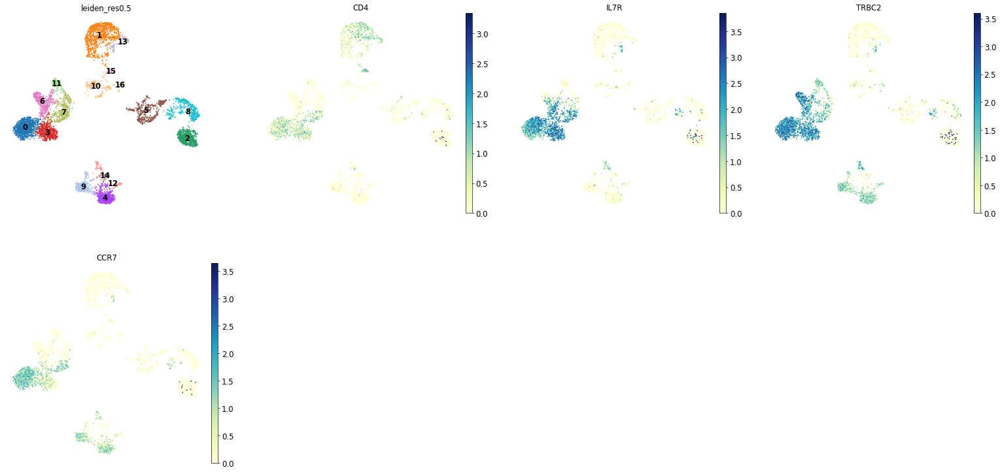

In [134]:
m_genes = marker_genes['CD4+ T naive']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes, legend_loc = 'on data')

### Cluster 3

In [57]:
orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '3'

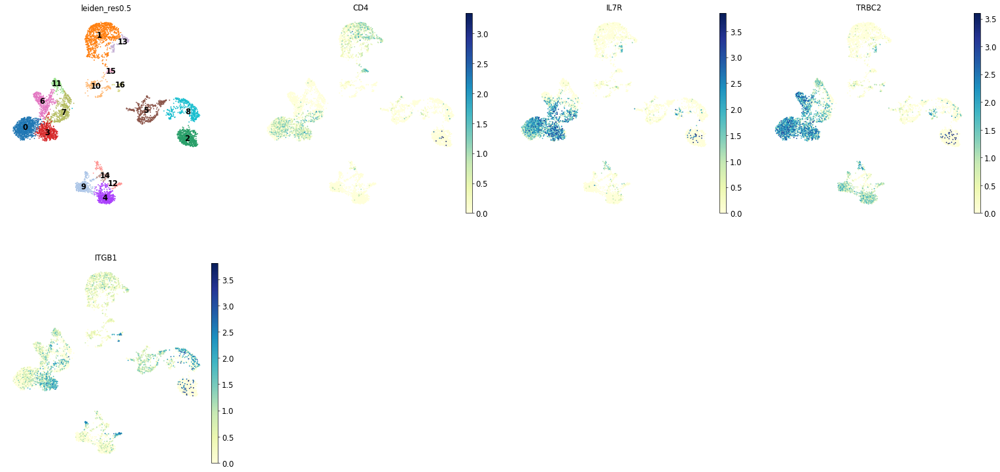

In [135]:
m_genes = marker_genes['CD4+ T activated']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes, legend_loc = 'on data')

### Cluster 6

In [59]:
orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '6'

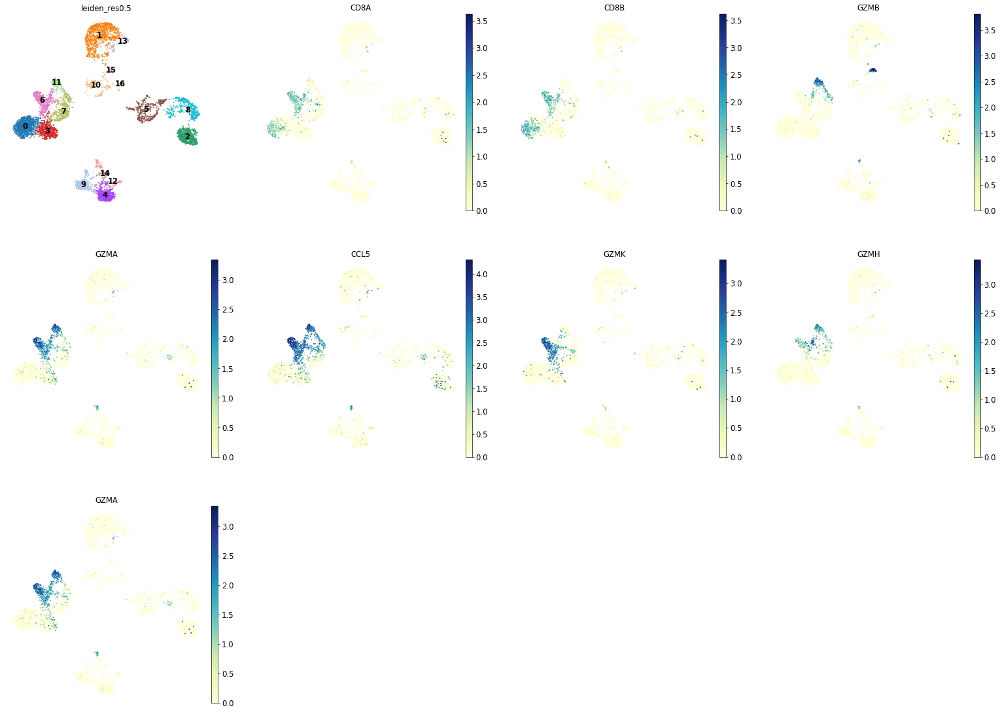

In [136]:
m_genes = marker_genes['CD8+ T']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes, legend_loc = 'on data')

### Cluster 7

In [61]:
orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '7'

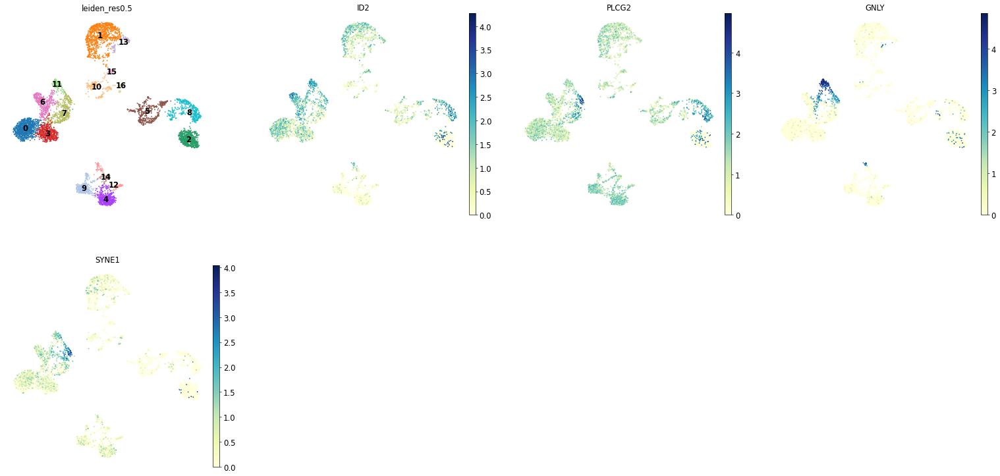

In [62]:
m_genes = marker_genes['ILC']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes, legend_loc = 'on data')

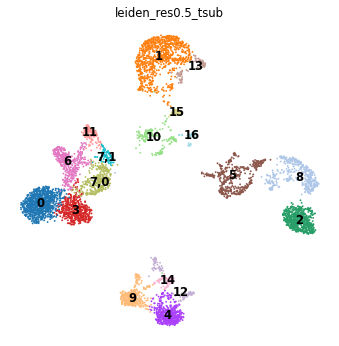

0      935
1      896
2      631
3      508
4      498
5      442
6      414
8      393
9      369
7,0    329
10     182
11     148
12     113
13      91
7,1     79
14      76
15      58
16      44
Name: leiden_res0.5_tsub, dtype: int64

In [63]:
res = 0.15
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

### Cluster 11

In [64]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '11'

In [65]:
marker_genes['NK']

['GNLY', 'NKG7', 'CD247', 'FCER1G', 'TYROBP', 'KLRG1', 'FCGR3A']

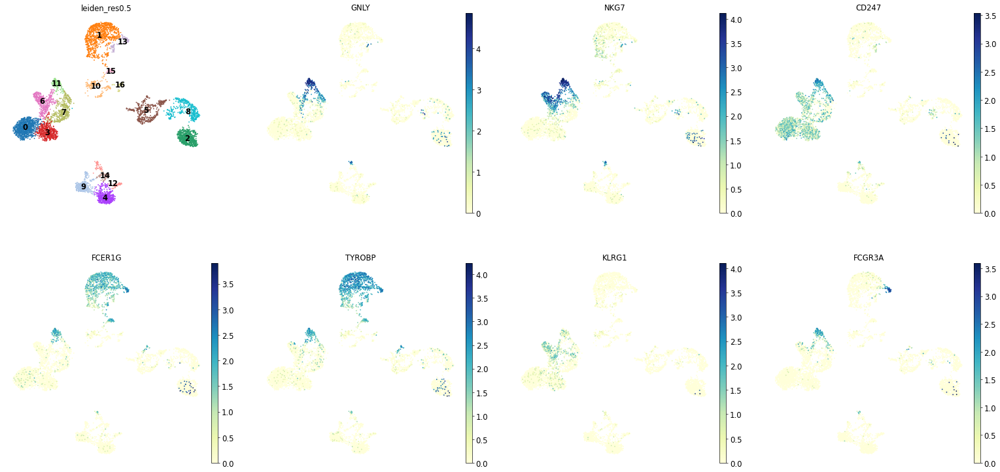

In [66]:
m_genes = marker_genes['NK']
plot_genes = [g for g in m_genes if g in adata_gex.var_names]
sc.pl.umap(adata_gex, color=['leiden_res0.5']+plot_genes, legend_loc = 'on data')

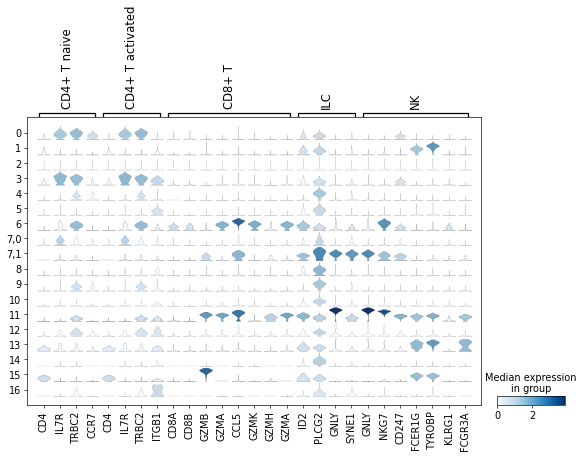

In [67]:
# Summary
sc.pl.stacked_violin(adata_gex, var_names={a:marker_genes[a] for a in ['CD4+ T naive','CD4+ T activated',
                                                                       'CD8+ T', 'ILC', 'NK'] }, groupby=new_key)

## Monocytes & DCs

### Cluster 1

In [68]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '1'

In [69]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

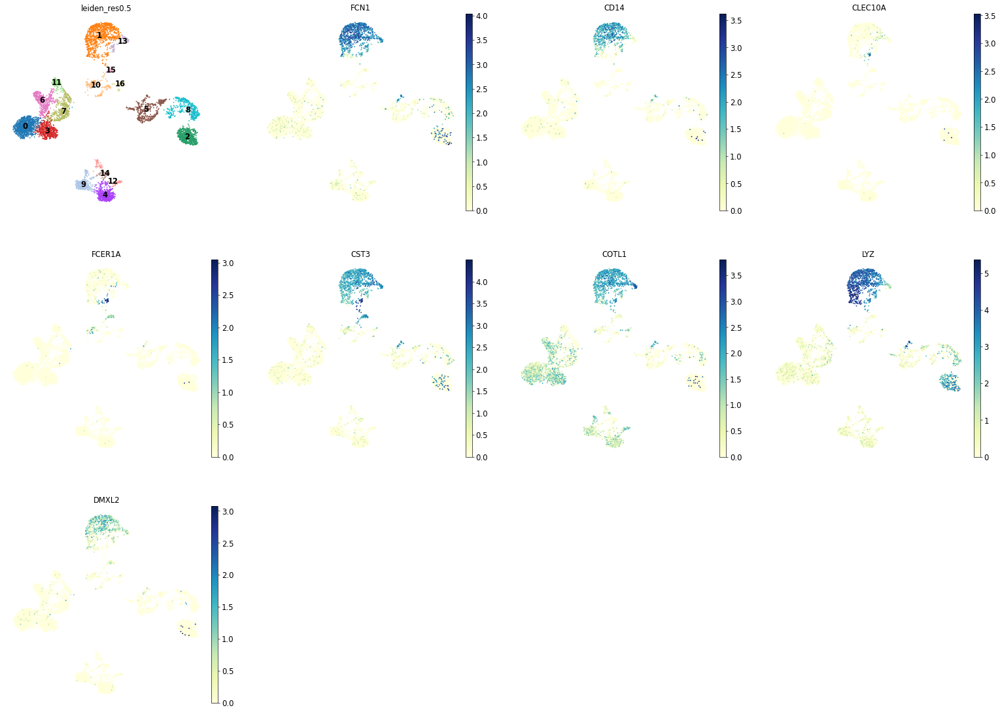

In [70]:
m_genes1 = marker_genes['CD14+ Mono']
m_genes2 = marker_genes['cDC2']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

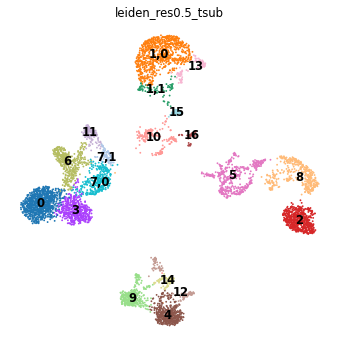

0      935
1,0    812
2      631
3      508
4      498
5      442
6      414
8      393
9      369
7,0    329
10     182
11     148
12     113
13      91
1,1     84
7,1     79
14      76
15      58
16      44
Name: leiden_res0.5_tsub, dtype: int64

In [71]:
res = 0.1
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

#### Subcluster level 2

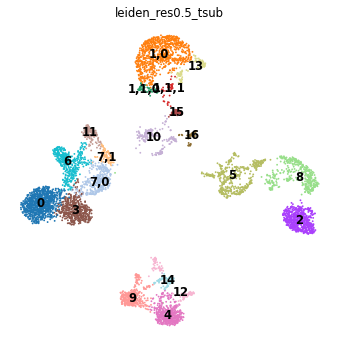

0        935
1,0      812
2        631
3        508
4        498
5        442
6        414
8        393
9        369
7,0      329
10       182
11       148
12       113
13        91
7,1       79
14        76
15        58
1,1,0     46
16        44
1,1,1     38
Name: leiden_res0.5_tsub, dtype: int64

In [72]:
res = 0.2
sub_clus = '1,1'
sc.tl.leiden(adata_gex, restrict_to=(new_key, [sub_clus]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

### Cluster 13

In [73]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '13'

In [74]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

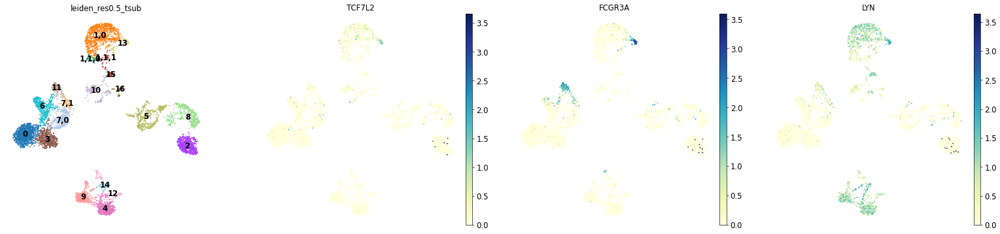

In [75]:
m_genes1 = marker_genes['CD16+ Mono']
#m_genes2 = marker_genes['cDC2']
sc.pl.umap(adata_gex, color=[orig_key]+m_genes1, legend_loc = 'on data')

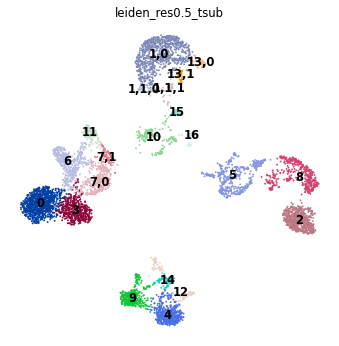

0        935
1,0      812
2        631
3        508
4        498
5        442
6        414
8        393
9        369
7,0      329
10       182
11       148
12       113
7,1       79
14        76
15        58
13,0      53
1,1,0     46
16        44
1,1,1     38
13,1      38
Name: leiden_res0.5_tsub, dtype: int64

In [76]:
res = 0.2
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

## Erythrocyte linage

### Cluster 2

In [77]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '2'

In [78]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

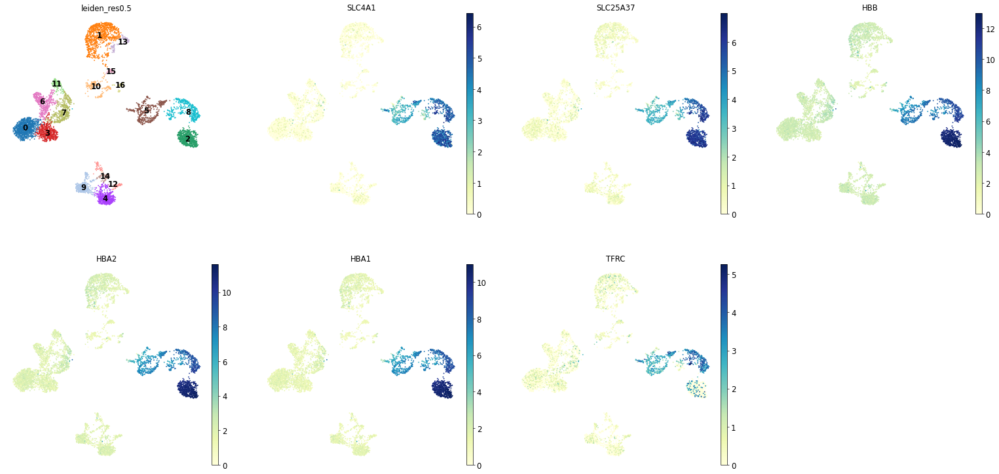

In [79]:
m_genes1 = marker_genes['Reticulocyte']
#m_genes2 = marker_genes['cDC2']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1, legend_loc = 'on data')

### Cluster 5

In [80]:
orig_key = 'leiden_res0.5_tsub'
#orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '5'

In [81]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

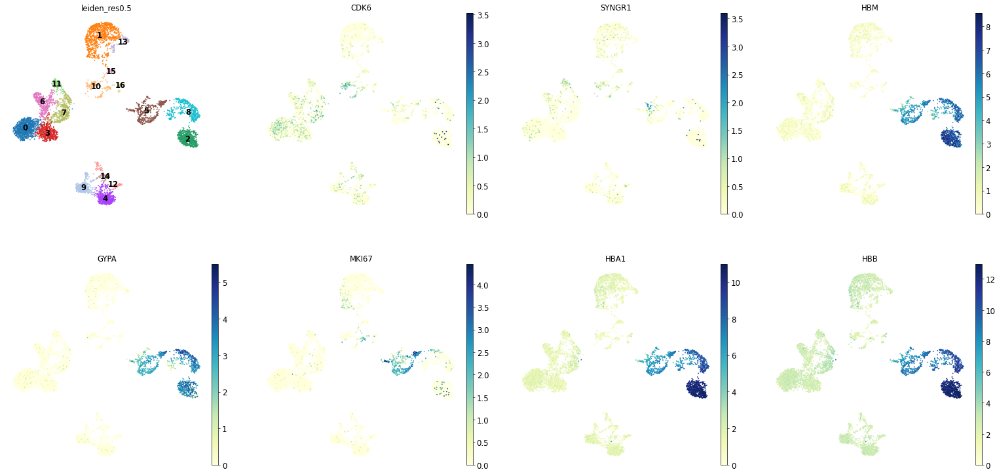

In [82]:
m_genes1 = marker_genes['Proerythroblast']
m_genes2 = marker_genes['Erythroblast']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

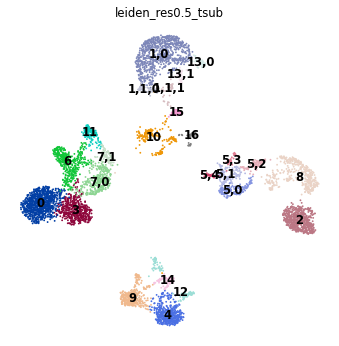

0        935
1,0      812
2        631
3        508
4        498
6        414
8        393
9        369
7,0      329
10       182
5,0      157
11       148
5,1      130
12       113
5,2       91
7,1       79
14        76
15        58
13,0      53
1,1,0     46
16        44
13,1      38
1,1,1     38
5,3       34
5,4       30
Name: leiden_res0.5_tsub, dtype: int64

In [83]:
res = 0.25
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

### Cluster 8

In [84]:
orig_key = 'leiden_res0.5_tsub'
#orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '8'

In [85]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

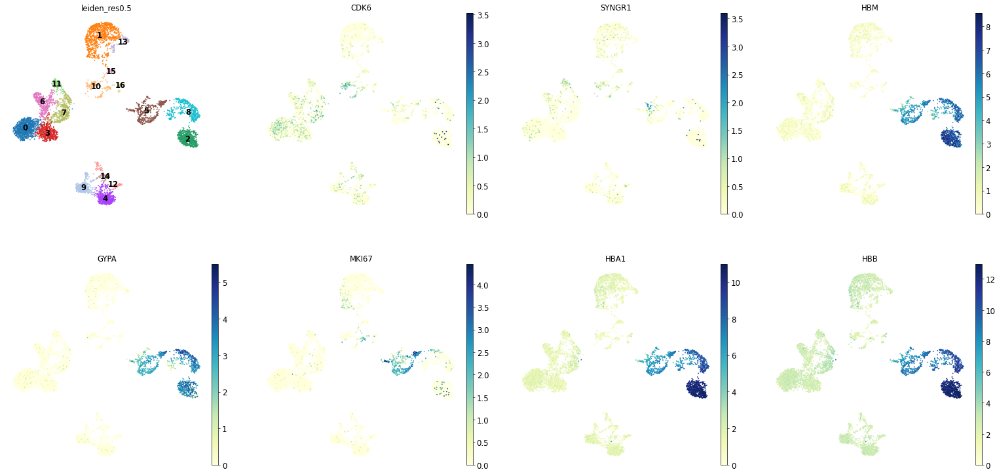

In [86]:
m_genes1 = marker_genes['Proerythroblast']
m_genes2 = marker_genes['Erythroblast']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

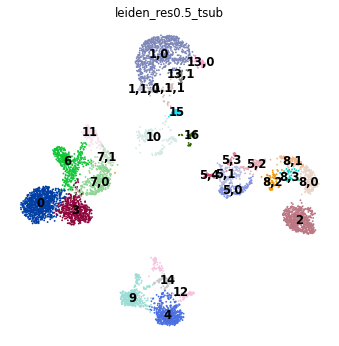

0        935
1,0      812
2        631
3        508
4        498
6        414
9        369
7,0      329
8,0      184
10       182
5,0      157
11       148
5,1      130
12       113
8,1       95
5,2       91
7,1       79
14        76
8,2       69
15        58
13,0      53
1,1,0     46
8,3       45
16        44
1,1,1     38
13,1      38
5,3       34
5,4       30
Name: leiden_res0.5_tsub, dtype: int64

In [87]:
res = 0.25
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

## B cells

### Cluster 4

In [88]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '4'

In [89]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

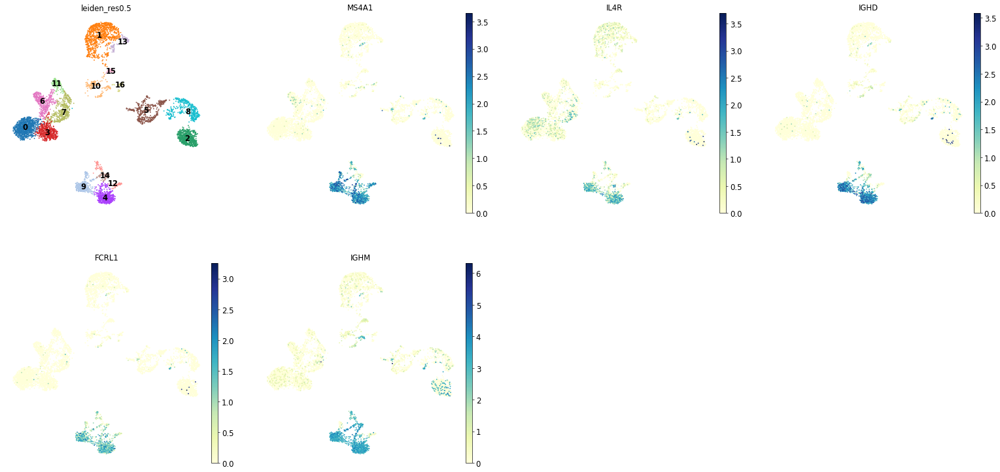

In [90]:
m_genes1 = marker_genes['Naive CD20+ B']
#m_genes2 = marker_genes['B1 B']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1, legend_loc = 'on data')

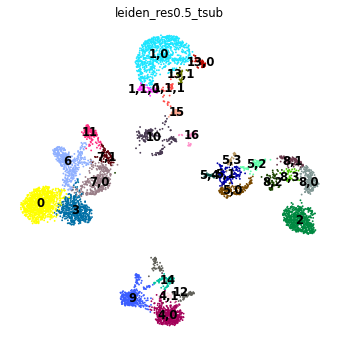

0        935
1,0      812
2        631
3        508
4,0      475
6        414
9        369
7,0      329
8,0      184
10       182
5,0      157
11       148
5,1      130
12       113
8,1       95
5,2       91
7,1       79
14        76
8,2       69
15        58
13,0      53
1,1,0     46
8,3       45
16        44
1,1,1     38
13,1      38
5,3       34
5,4       30
4,1       23
Name: leiden_res0.5_tsub, dtype: int64

In [91]:
res = 0.15
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

### Cluster 9

In [92]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '9'

In [93]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

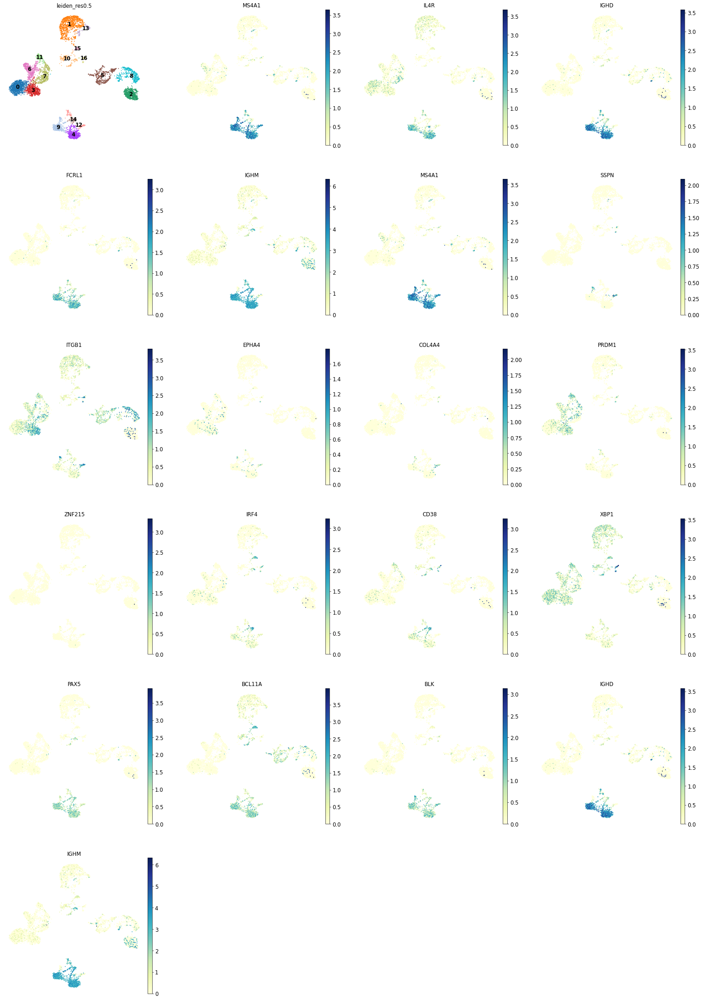

In [94]:
m_genes1 = marker_genes['Naive CD20+ B']
m_genes2 = marker_genes['B1 B']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

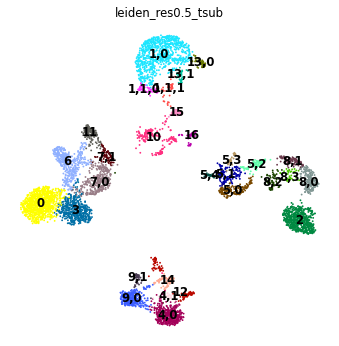

0        935
1,0      812
2        631
3        508
4,0      475
6        414
7,0      329
9,0      324
8,0      184
10       182
5,0      157
11       148
5,1      130
12       113
8,1       95
5,2       91
7,1       79
14        76
8,2       69
15        58
13,0      53
1,1,0     46
8,3       45
9,1       45
16        44
1,1,1     38
13,1      38
5,3       34
5,4       30
4,1       23
Name: leiden_res0.5_tsub, dtype: int64

In [95]:
res = 0.15
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

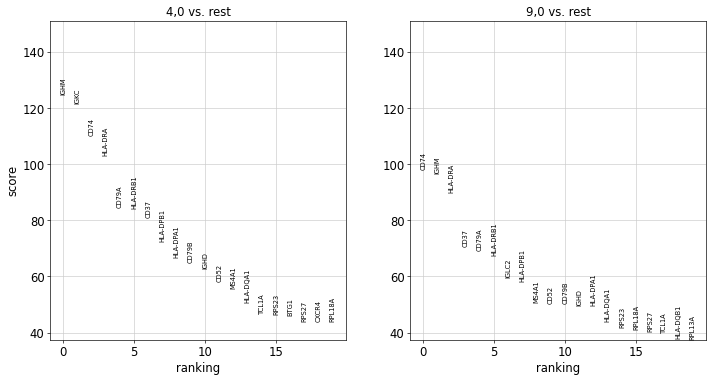

In [96]:
# Get markers for B cell clusters 4,0 vs 9,0
new_groups = ['4,0', '9,0']
sc.tl.rank_genes_groups(adata_gex, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_gex, key=new_rg_key, groups=new_groups, ncols=3)

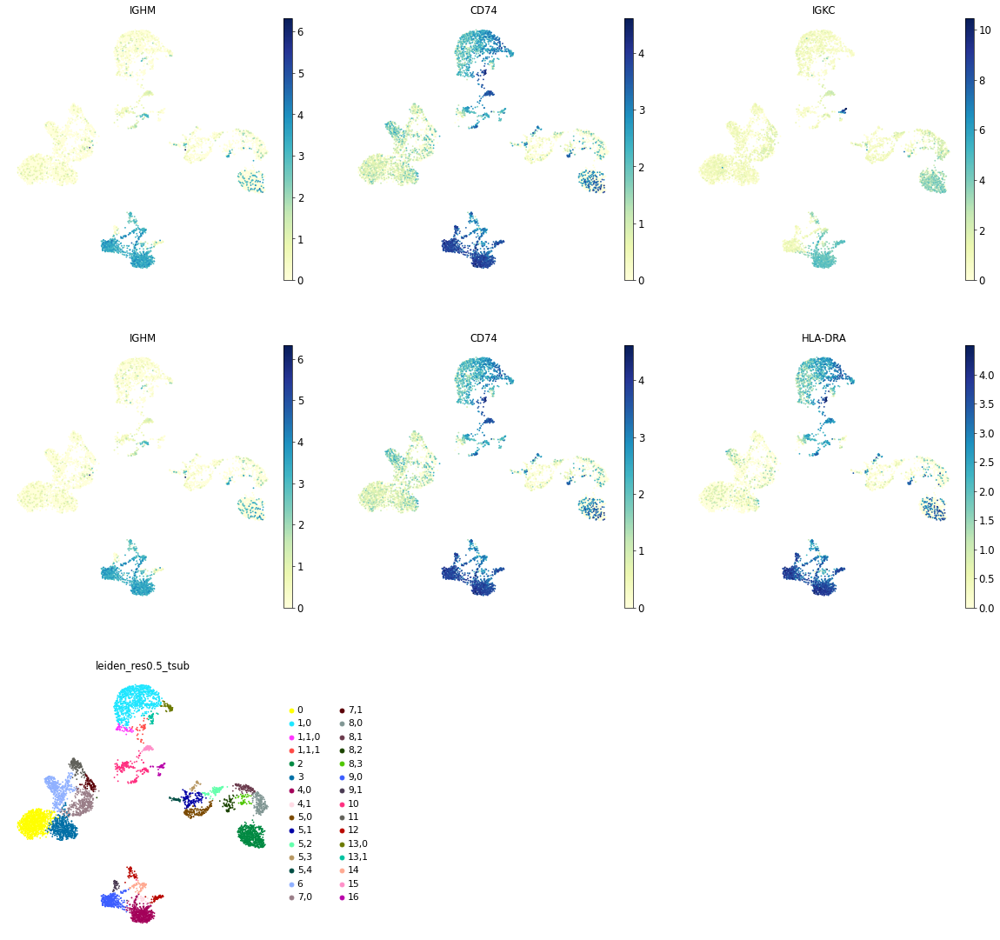

In [97]:
top_3_genes = list(adata_gex.uns[new_rg_key]['names'][0]) + \
    list(adata_gex.uns[new_rg_key]['names'][1])+ \
    list(adata_gex.uns[new_rg_key]['names'][2])
                                                               
sc.pl.umap(adata_gex, color=top_3_genes+[new_key], ncols=3) # IGKC+ 

### Cluster 12

In [98]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '12'

In [99]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

In [100]:
#m_genes1 = marker_genes['Naive CD20+ B']
#m_genes2 = marker_genes['B1 B']
#sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

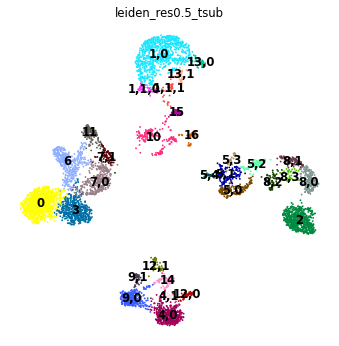

0        935
1,0      812
2        631
3        508
4,0      475
6        414
7,0      329
9,0      324
8,0      184
10       182
5,0      157
11       148
5,1      130
8,1       95
5,2       91
7,1       79
14        76
8,2       69
12,0      59
15        58
12,1      54
13,0      53
1,1,0     46
8,3       45
9,1       45
16        44
1,1,1     38
13,1      38
5,3       34
5,4       30
4,1       23
Name: leiden_res0.5_tsub, dtype: int64

In [101]:
res = 0.15
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts() 

### Cluster 14

In [102]:
orig_key = 'leiden_res0.5_tsub'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '14'

In [103]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

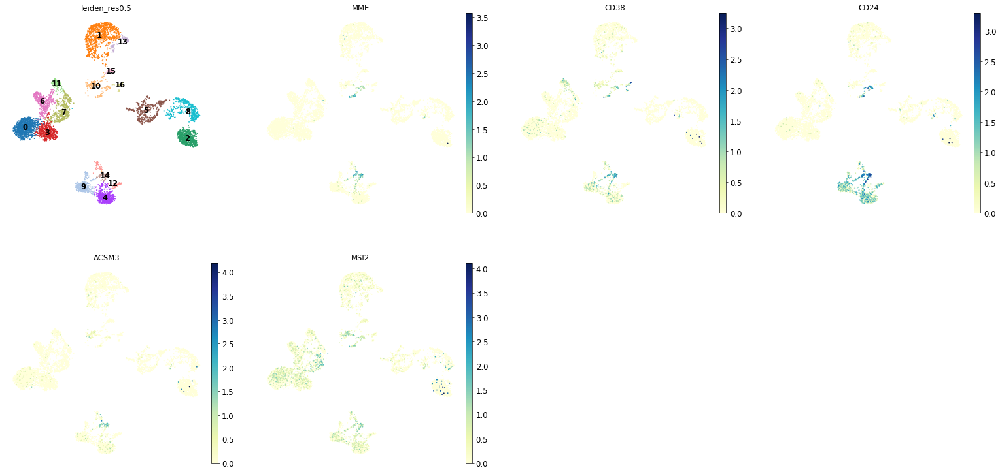

In [104]:
m_genes1 = marker_genes['Transitional B']
#m_genes2 = marker_genes['B1 B']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1, legend_loc = 'on data')

## Stem and progenitors

### Cluster 10

In [105]:
orig_key = 'leiden_res0.5_tsub'
#orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '10'

In [106]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

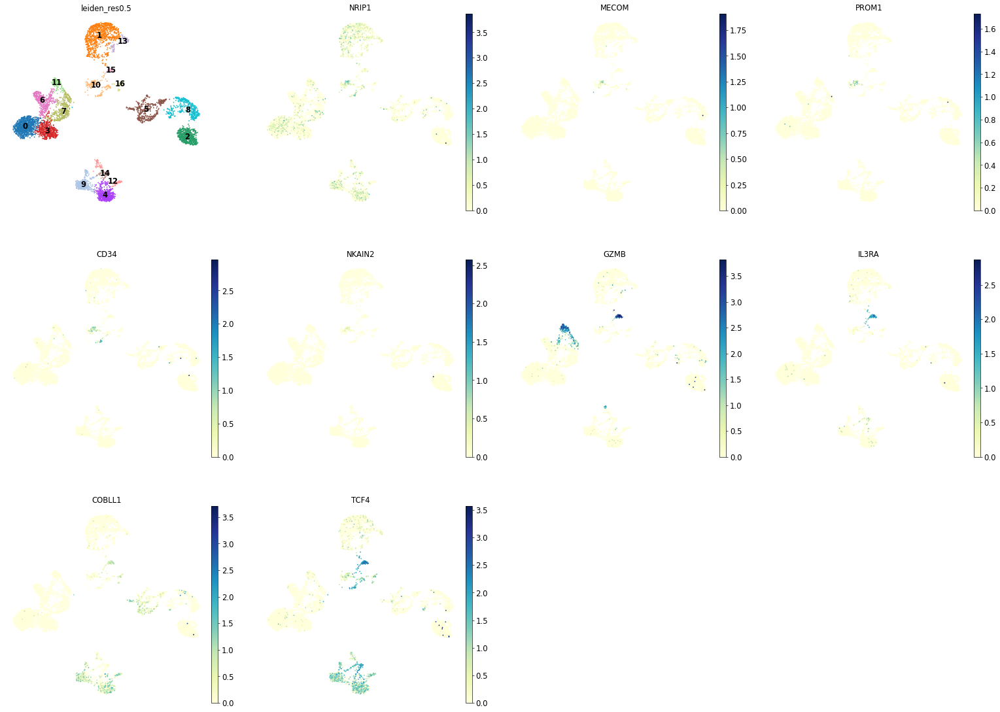

In [107]:
m_genes1 = marker_genes['HSC']
m_genes2 = marker_genes['pDCs']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

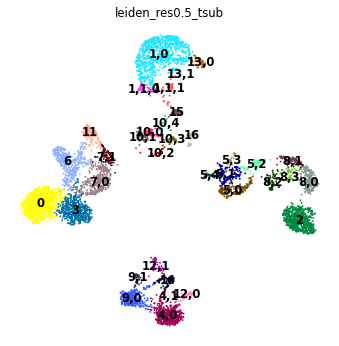

0        935
1,0      812
2        631
3        508
4,0      475
6        414
7,0      329
9,0      324
8,0      184
5,0      157
11       148
5,1      130
8,1       95
5,2       91
7,1       79
14        76
8,2       69
12,0      59
15        58
10,0      56
12,1      54
13,0      53
1,1,0     46
8,3       45
9,1       45
16        44
10,1      44
1,1,1     38
13,1      38
10,2      36
10,3      34
5,3       34
5,4       30
4,1       23
10,4      12
Name: leiden_res0.5_tsub, dtype: int64

In [108]:
res = 0.5
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

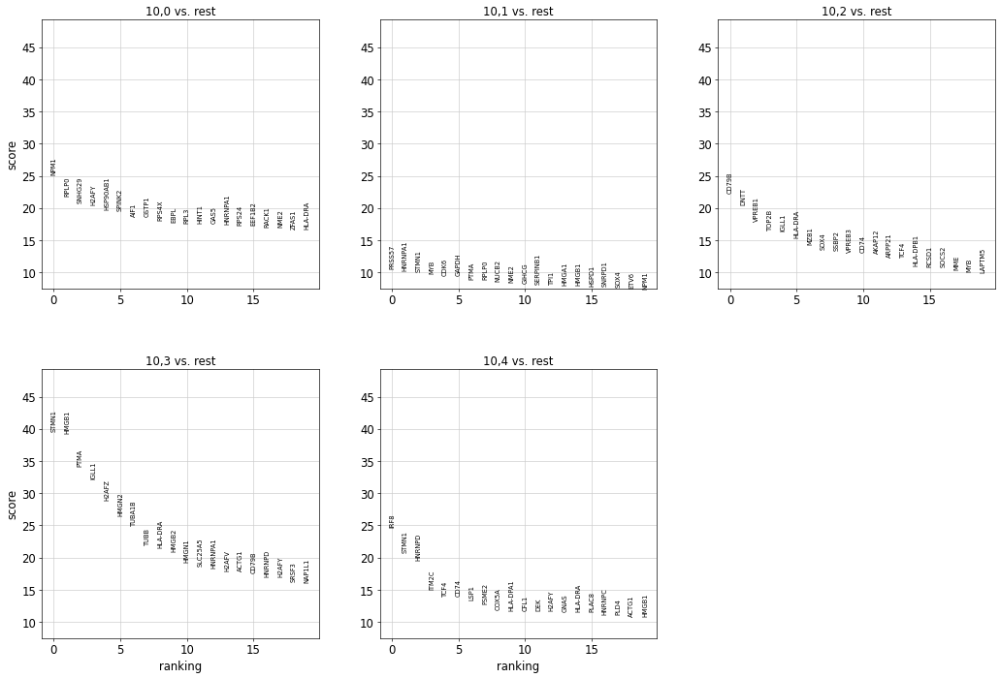

In [109]:
# Find markers of subclusters
num_subclusts = 5
new_groups = [sub_key+','+str(i) for i in range(num_subclusts)]
sc.tl.rank_genes_groups(adata_gex, groupby=new_key, key_added=new_rg_key, groups=new_groups)
sc.pl.rank_genes_groups(adata_gex, key=new_rg_key, groups=new_groups, ncols=3)

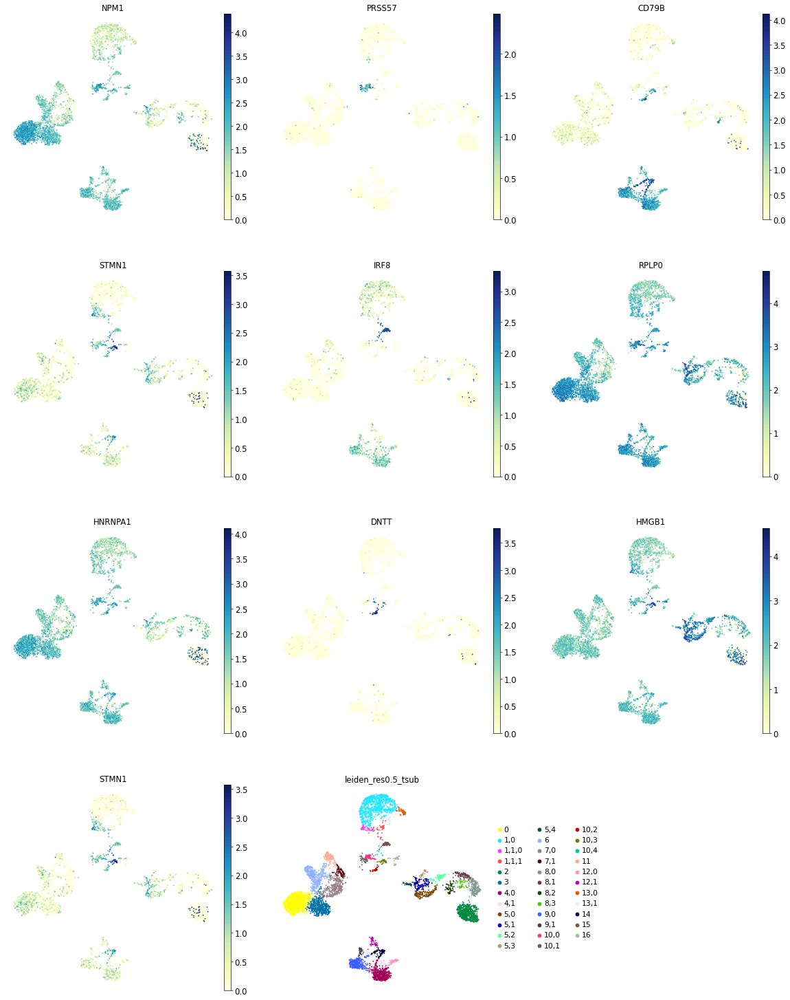

In [110]:
top_2_genes = list(adata_gex.uns[new_rg_key]['names'][0])+list(adata_gex.uns[new_rg_key]['names'][1])
sc.pl.umap(adata_gex, color=top_2_genes+[new_key], ncols=3)

### Cluster 15

In [111]:
orig_key = 'leiden_res0.5_tsub'
#orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '15'

In [112]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

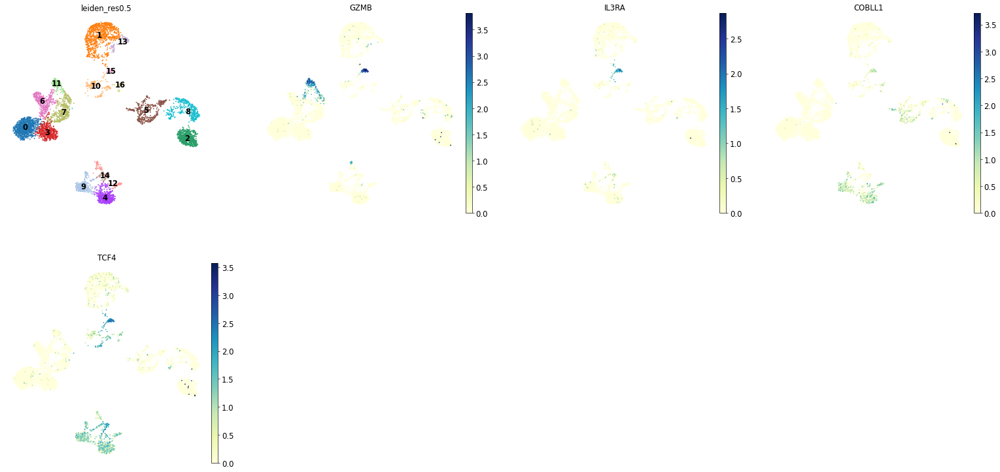

In [113]:
m_genes1 = marker_genes['pDCs']
#m_genes2 = marker_genes['Plasmablast']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1, legend_loc = 'on data')

### Cluster 16

In [114]:
orig_key = 'leiden_res0.5_tsub'
#orig_key = 'leiden_res0.5'
new_key = 'leiden_res0.5_tsub'
new_rg_key = 'rg_res0.5_tsub'
sub_key = '16'

In [115]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'Naive CD20+ B', 'B1 B', 'Transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

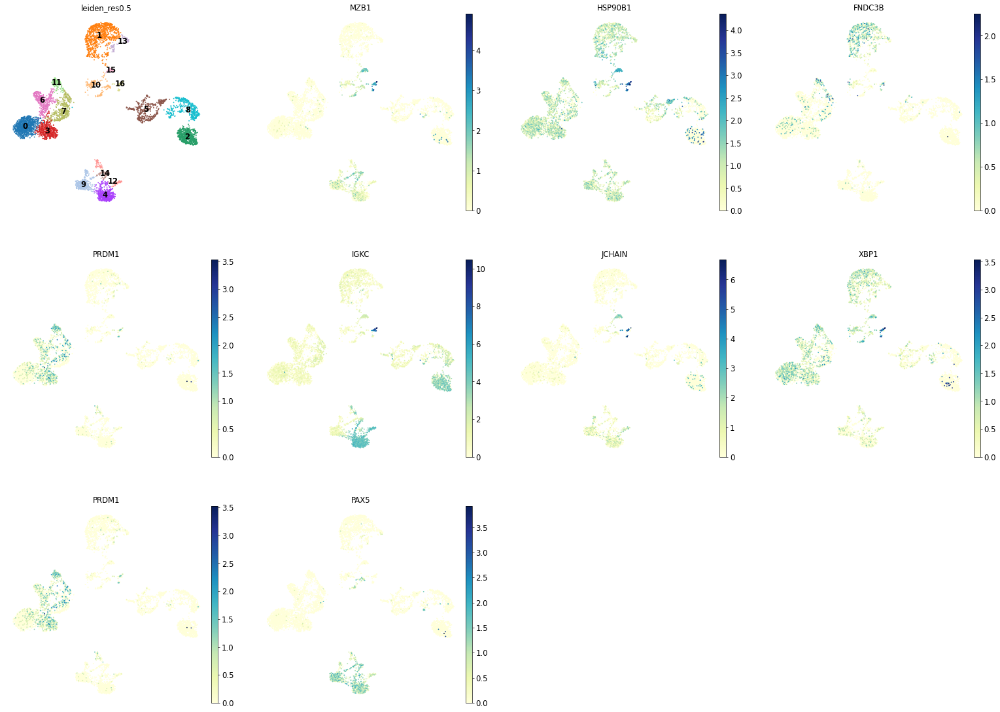

In [116]:
m_genes1 = marker_genes['Plasma cells']
m_genes2 = marker_genes['Plasmablast']
sc.pl.umap(adata_gex, color=['leiden_res0.5']+m_genes1+m_genes2, legend_loc = 'on data')

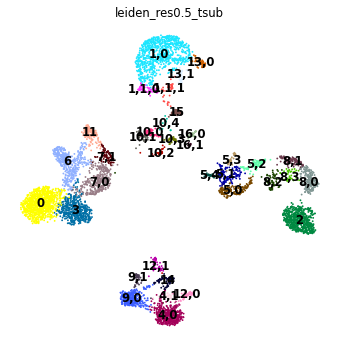

0        935
1,0      812
2        631
3        508
4,0      475
6        414
7,0      329
9,0      324
8,0      184
5,0      157
11       148
5,1      130
8,1       95
5,2       91
7,1       79
14        76
8,2       69
12,0      59
15        58
10,0      56
12,1      54
13,0      53
1,1,0     46
8,3       45
9,1       45
10,1      44
13,1      38
1,1,1     38
10,2      36
10,3      34
5,3       34
16,0      34
5,4       30
4,1       23
10,4      12
16,1      10
Name: leiden_res0.5_tsub, dtype: int64

In [117]:
res = 0.15
sc.tl.leiden(adata_gex, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(adata_gex, color=new_key, legend_loc='on data')
adata_gex.obs[new_key].value_counts()

## Cluster dictionary

In [173]:
rename_clust_dict = {
    
    '0':'CD4+ and CD8+ T naive',
    '1,0':'CD14+ Mono',
    '1,1,0':'G/M prog / CD14+ Mono',
    '1,1,1':'cDC2',
    '2':'Reticulocyte', # TFRC neg
    '3':'CD4+ T activated',
    '4,0':'naive CD20+ B - IGKC+',
    '4,1':'Doublet',
    '5,0':'Erythroblast',
    '5,1':'Proerythroblast',
    '5,2':'Erythroblast',
    '5,3':'ID2-hi myeloid prog - doublet?',
    '5,4':'lowQ',
    '6':'CD8+ T',
    '7,0':'lowQ',
    '7,1':'ILC',
    '8,0':'Normoblast',
    '8,1':'Normoblast',
    '8,2':'Doublet',
    '8,3':'lowQ',
    '9,0':'naive CD20+ B - IGKC-',
    '9,1':'B1 B - IGKC-',
    '10,0':'HSC',
    '10,1':'G/M prog ?',
    '10,2':'Lymph prog',
    '10,3':'HSPC STMN1+ ?', # HMGB1 + as well
    '10,4':'prog lowQ',
    '11':'NK',
    '12,0':'B1 B - IGKC+',
    '12,1':'Doublet',
    '13,0':'CD16+ Mono',
    '13,1':'Doublet',
    '14':'transitional B',
    '15':'pDCs',
    '16,0':'Plasma cells',
    '16,1':'Plasmablast'
    
}

# Cluster overview

In [174]:
adata_gex.obs['leiden_final'] = adata_gex.obs[new_key].map(rename_clust_dict)

... storing 'leiden_final' as categorical


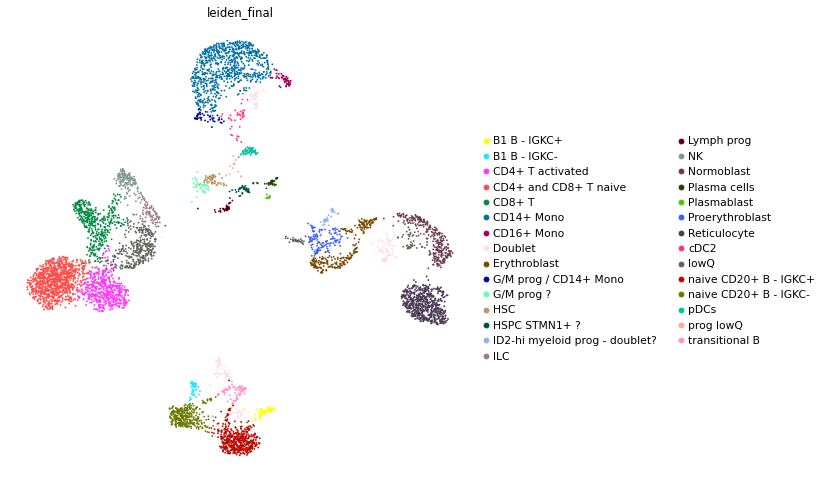

In [175]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata_gex, color='leiden_final')
plt.rcParams['figure.figsize'] = (8,8)

## Doublet and lowQ filtering

In [176]:
adata_gex

AnnData object with n_obs × n_vars = 6206 × 15422
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'n_genes', 'size_factors', 'S_score', 'G2M_score', 'phase', 'leiden_res0.3', 'leiden_res0.5', 'leiden_res0.8', 'leiden_res1', 'doublet_score', 'predicted_doublet', 'leiden_res0.5_tsub', 'leiden_final'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'phase_colors', 'leiden', 'leiden_res0.3_colors', 'leiden_res0.5_colors', 'leiden_res0.8_colors', 'leiden_res1_colors', 'predicted_doublet_colors', 'rank_gene

In [177]:
adata_gex.obs['leiden_final'].value_counts()

CD4+ and CD8+ T naive             935
CD14+ Mono                        812
Reticulocyte                      631
CD4+ T activated                  508
naive CD20+ B - IGKC+             475
CD8+ T                            414
lowQ                              404
naive CD20+ B - IGKC-             324
Normoblast                        279
Erythroblast                      248
Doublet                           184
NK                                148
Proerythroblast                   130
ILC                                79
transitional B                     76
B1 B - IGKC+                       59
pDCs                               58
HSC                                56
CD16+ Mono                         53
G/M prog / CD14+ Mono              46
B1 B - IGKC-                       45
G/M prog ?                         44
cDC2                               38
Lymph prog                         36
ID2-hi myeloid prog - doublet?     34
Plasma cells                       34
HSPC STMN1+ 

In [178]:
(184+404+12)/6206   # lowQ, Doublet, prog lowQ 

0.09668063164679343

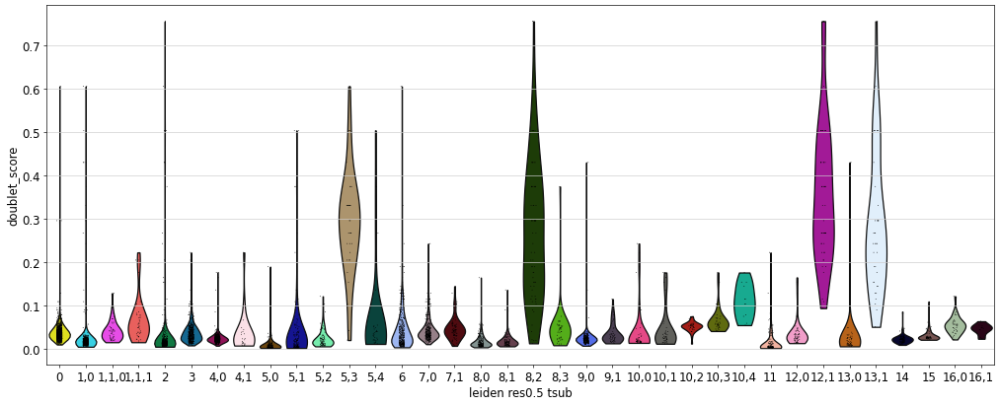

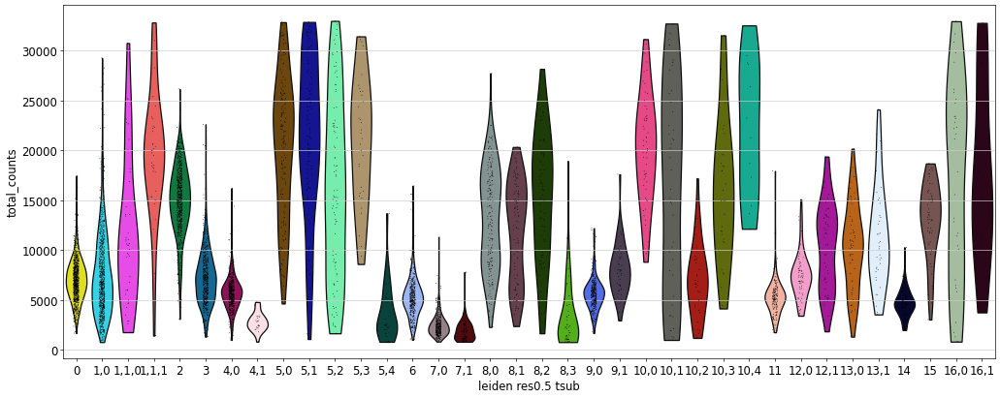

In [179]:
plt.rcParams['figure.figsize']=(16,8)
sc.pl.violin(adata_gex, keys='doublet_score', groupby=new_key)
sc.pl.violin(adata_gex, keys='total_counts', groupby=new_key)
plt.rcParams['figure.figsize']=(8,8)


Doublet clusters: Always lower expression than in their "parent" clusters; all RNA markers!
- B & T: 'CD24', 'CD22', 'ARHGAP24', 'BANK1', 'BACH2', 'AFF3', 'CD247', 'BCL11B', 'INPP4B', 'CAMK4', 'CD3D', 'TRBC2', 'IL7R'
- Erythro+others: 'HBB', 'HBA1', 'ANK1'
- Mono+B: 'PLXDC2', 'ARHGAP26', 'FCN1', 'AFF3', 'EBF1', 'BANK1', 'FCRL1', 'PAX5'
- Mono+T: 'PLXDC2', 'ARHGAP26', 'FCN1', 'BCL11B', 'SKAP1', 'CD247'

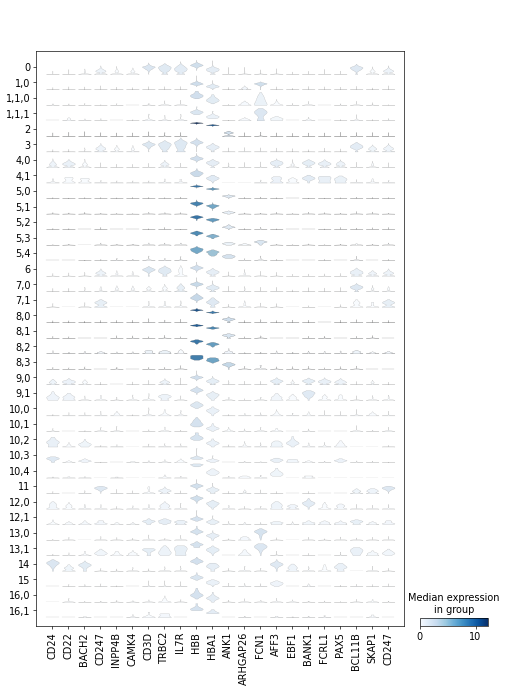

In [180]:
# Check the above markers again to make sure
sc.pl.stacked_violin(adata_gex, var_names=['CD24', 'CD22', 'BACH2', 'CD247', 'INPP4B', 'CAMK4', 'CD3D', 'TRBC2', 'IL7R', 
                                           'HBB', 'HBA1', 'ANK1', 'ARHGAP26', 'FCN1', 'AFF3', 'EBF1', 'BANK1', 'FCRL1', 'PAX5', 
                                           'BCL11B', 'SKAP1', 'CD247'], groupby=new_key)

Indeed the likely doublet clusters have broad expression of all markers, and don't express any marker more highly than any other cell cluster that is not designated as doublet.

In [181]:
adata_gex_filt = adata_gex[~adata_gex.obs['leiden_final'].isin(['lowQ', 'Doublet', 'prog lowQ '])].copy()

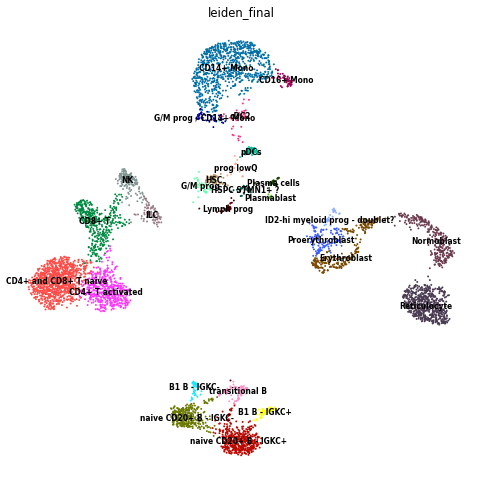

In [182]:
plt.rcParams['figure.figsize'] = (10,10)
sc.pl.umap(adata_gex_filt, color='leiden_final', legend_loc = 'on data', legend_fontsize=9)
plt.rcParams['figure.figsize'] = (7,7)

# Marker overview

In [188]:
marker_genes.keys()

dict_keys(['CD14+ Mono', 'CD16+ Mono', 'ID2-hi myeloid prog', 'cDC1', 'cDC2', 'Reticulocyte', 'Normoblast', 'Erythroblast', 'Proerythroblast', 'NK', 'ILC', 'Lymph prog', 'naive CD20+ B - IGKC+', 'naive CD20+ B - IGKC-', 'B1 B - IGKC+', 'B1 B - IGKC-', 'transitional B', 'Plasma cells', 'Plasmablast', 'CD4+ T activated', 'CD4+ T naive', 'CD8+ T', 'T activation', 'T naive', 'pDCs', 'G/M prog', 'HSC', 'MK/E prog', 'HSPC STMN1+'])

In [ ]:
#Overview
adata_plot = adata_gex_filt.copy()
sc.pp.scale(adata_plot, max_value=5)

#Monocytes
sc.pl.stacked_violin(adata_plot, groupby='leiden_final', use_raw=False, swap_axes=True,                     
                     var_names={a:marker_genes[a] for a in ['CD14+ Mono', 'G/M prog', 'CD16+ Mono', 'pDCs', 'cDC2']})

#B cells
sc.pl.stacked_violin(adata_plot, groupby='leiden_final', use_raw=False, swap_axes=True,                     
                     var_names={a:marker_genes[a] for a in ['naive CD20+ B - IGKC+', 'naive CD20+ B - IGKC-', 'B1 B - IGKC+', 'B1 B - IGKC-', 'transitional B','Plasma cells', 'Plasmablast']})

#Progenitors
sc.pl.stacked_violin(adata_plot, groupby='leiden_final', use_raw=False, swap_axes=True,                     
                     var_names={a:marker_genes[a] for a in ['HSC', 'HSPC STMN1+', 'Lymph prog', 'MK/E prog', 'ID2-hi myeloid prog']})

#Erythropoiesis
sc.pl.stacked_violin(adata_plot, groupby='leiden_final', use_raw=False, swap_axes=True,                     
                     var_names={a:marker_genes[a] for a in ['Proerythroblast', 'Erythroblast','Normoblast', 'Reticulocyte']})


#T & NK cells
sc.pl.stacked_violin(adata_plot, groupby='leiden_final', use_raw=False, swap_axes=True,                     
                     var_names={a:marker_genes[a] for a in ['CD4+ T naive', 'CD4+ T activated', 'CD8+ T', 'NK', 'ILC']})



# Write output

In [ ]:
adata_gex_filt_slim = adata_gex_filt.copy()

In [ ]:
adata_gex_filt_slim.obs = adata_gex_filt_slim.obs[['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'size_factors', 'phase',
                                                   'leiden_res0.5_tsub', 'leiden_final']]

adata_gex_filt_slim.var = adata_gex_filt_slim.var[['gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable']]

In [ ]:
adata_gex_filt_slim

In [ ]:
adata_gex_filt_slim.write('data/cite/proc_data/s1d1/Donor1_gex.h5ad')